In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.metrics import r2_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

import warnings
warnings.filterwarnings("ignore")

In [21]:
rain = pd.read_csv('Regional_Avg_Rain.csv')
rain['Date'] = pd.to_datetime(rain['Date']) # Didn't make this a datetime already for some reason
df = rain.drop(columns = ['Year', 'Month'])
rain = rain.set_index('Date')

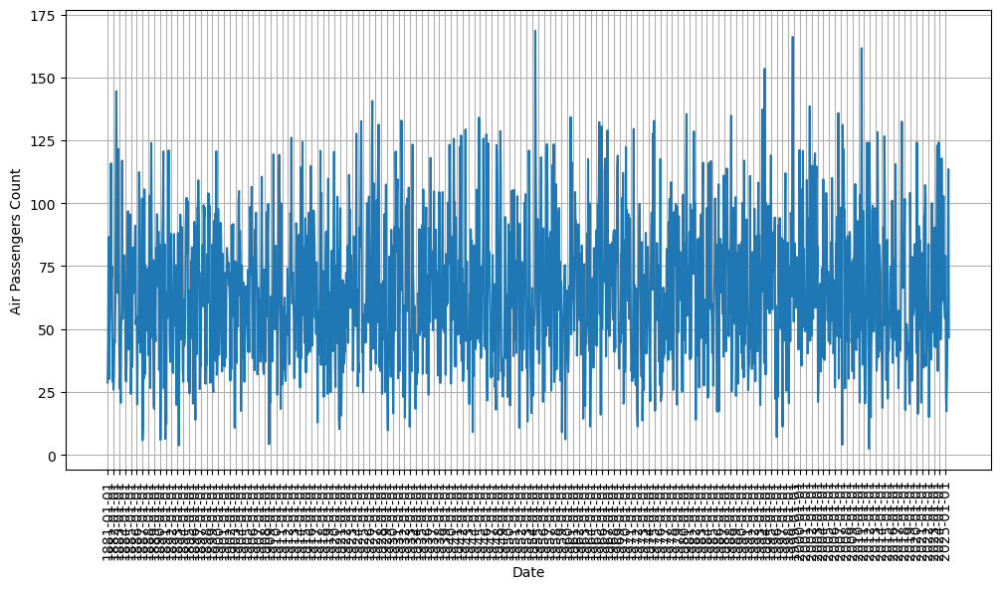

In [22]:
plt.figure(figsize = (12, 6))
plt.xlabel("Date (Month/Year)")
plt.ylabel("Air Passengers Count")

plt.plot(rain.index, rain['Germany'])
plt.xticks(rain.index[::12], rotation = 'vertical')
plt.grid()
plt.show()

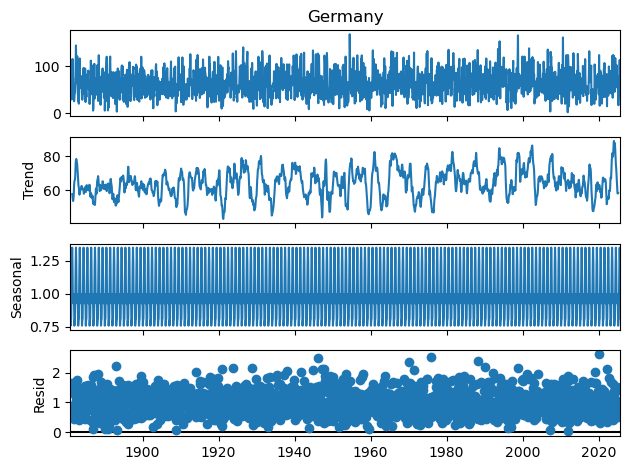

In [23]:
decom = seasonal_decompose(rain['Germany'], model = 'multiplicative')
decom.plot()
plt.show()

In [24]:
X,y = [], []
lag = 18
for i in range(len(rain) - lag - 1):
  X.append(rain['Germany'].iloc[i:i+lag])
  y.append(rain['Germany'].iloc[i+lag])
X = np.squeeze(X)
y = np.squeeze(y)
X[0], y[0]

(array([ 28.7,  43.7,  86.6,  30.1,  47.3,  58.7,  69. , 115.8,  70.1,
         74.9,  29.1,  39.6,  25.8,  31. ,  45.6,  44.6,  59.1, 110.4]),
 np.float64(144.5))

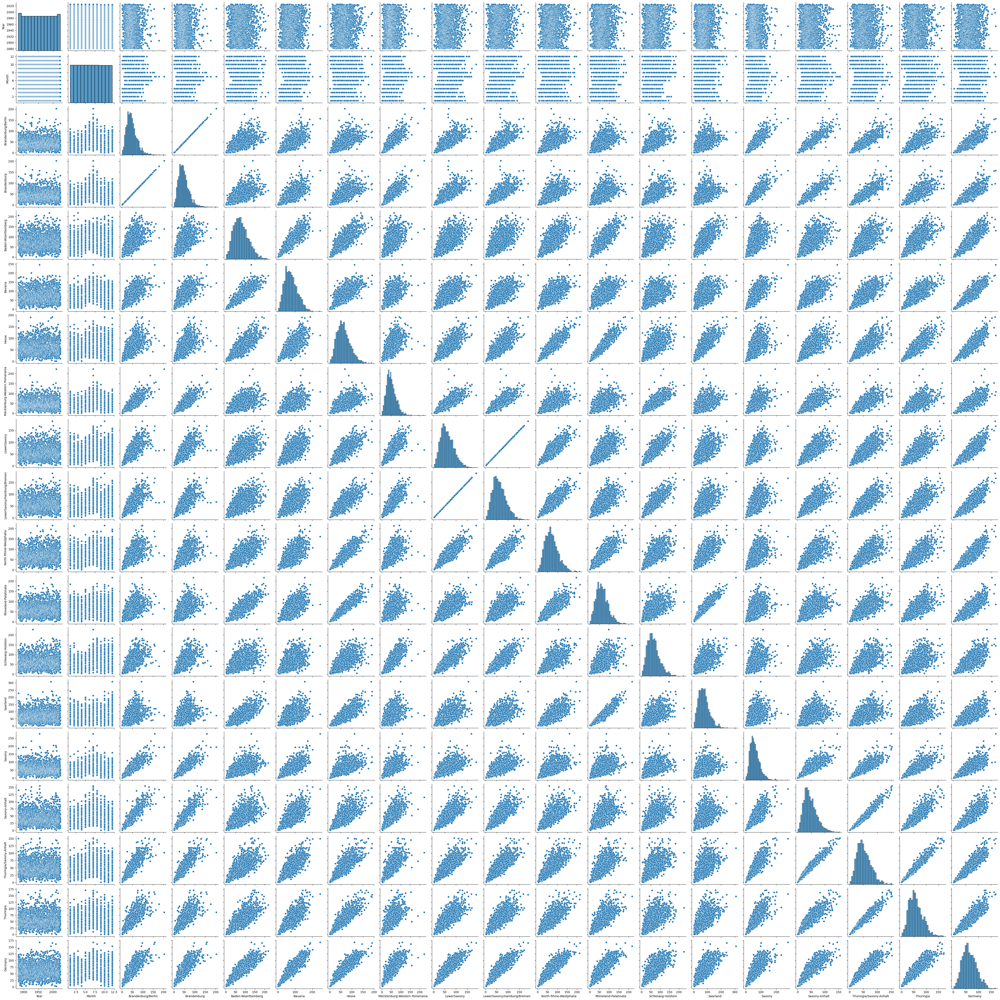

In [17]:
df = rain
sns.pairplot(data = df)

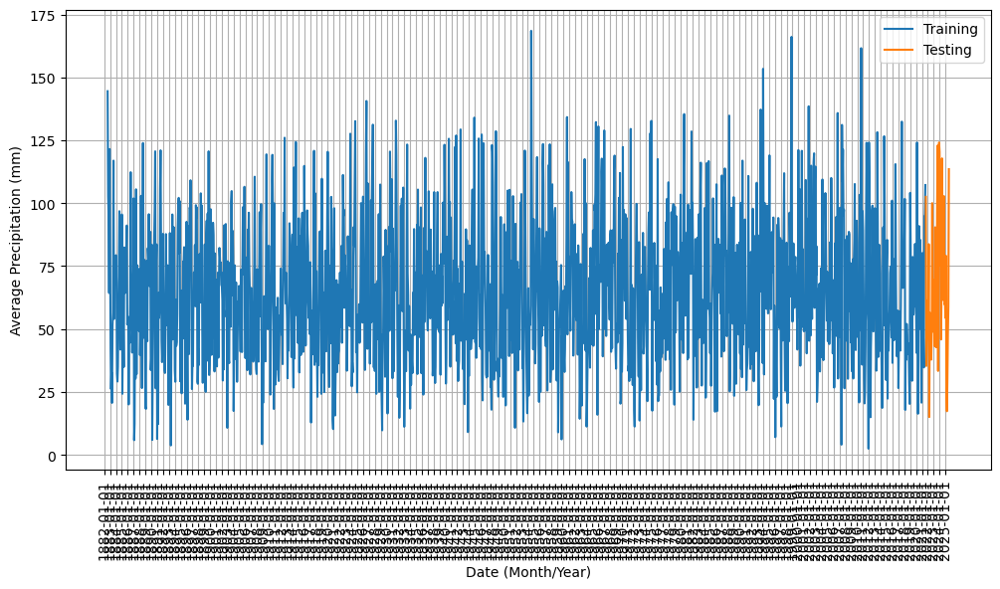

In [32]:
split_idx = 48
x_train, y_train, x_test, y_test = X[:-split_idx], y[:-split_idx], X[-split_idx:], y[-split_idx:]

plt.figure(figsize = (12, 6))
plt.xlabel("Date (Month/Year)")
plt.ylabel("Average Precipitation (mm)")

plt.plot(rain.index[lag + 1:-split_idx], y_train, label = 'Training')
plt.plot(rain.index[-split_idx:], y_test, label = 'Testing')
plt.xticks(rain.index[lag - 6::12], rotation = 'vertical')
plt.legend()
plt.grid()
plt.show()

In [33]:
regr = LinearRegression()
regr.fit(x_train, y_train)

LinearRegression()

In [34]:
predictingset = [x for x in x_train[-1]]
y_pred = []
for i in range(len(x_test)):
    pred = regr.predict([predictingset])
    y_pred.append(pred[0])
    predictingset.append(pred[0])
    predictingset = predictingset[1:]
y_pred

[np.float64(76.14487673850608),
 np.float64(69.83753265804381),
 np.float64(66.21377509433499),
 np.float64(61.96832420060174),
 np.float64(61.64817744718651),
 np.float64(59.58693335972196),
 np.float64(60.83475931431767),
 np.float64(60.406281780868895),
 np.float64(60.347600780598725),
 np.float64(62.2459795243153),
 np.float64(68.38526216158765),
 np.float64(73.09510042834472),
 np.float64(72.23109367025424),
 np.float64(68.6010573991083),
 np.float64(63.5660096924797),
 np.float64(61.95069849347144),
 np.float64(60.72672655312582),
 np.float64(61.08524001402213),
 np.float64(61.83183476273396),
 np.float64(62.355098728083526),
 np.float64(63.12323754536733),
 np.float64(64.49038099938738),
 np.float64(66.09084521195021),
 np.float64(67.34546071515642),
 np.float64(67.38149869654532),
 np.float64(66.10189244358862),
 np.float64(64.31923440187043),
 np.float64(62.89976876911672),
 np.float64(62.329388604761185),
 np.float64(62.46227739761843),
 np.float64(63.005722860685324),
 np.fl

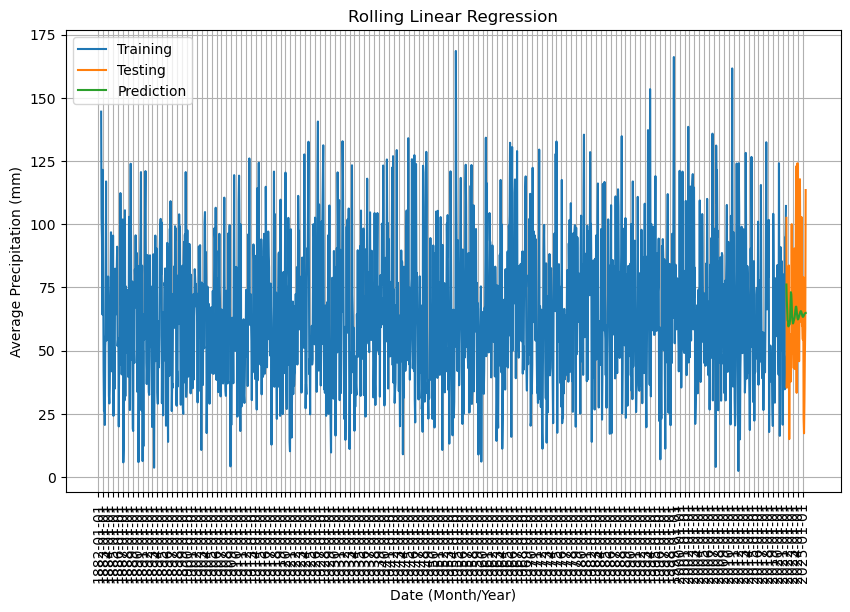

In [35]:
plt.figure(figsize=(10,6))
plt.xlabel("Date (Month/Year)")
plt.ylabel("Average Precipitation (mm)")

plt.plot(rain.index[lag + 1:-split_idx], y_train, label = 'Training')
plt.plot(rain.index[-split_idx:], y_test, label = 'Testing')
plt.plot(rain.index[-split_idx:], y_pred, label = 'Prediction')
plt.xticks(rain.index[lag - 6::12], rotation = 'vertical')
plt.legend()
plt.title('Rolling Linear Regression')
plt.grid()
plt.show()

In [36]:
print('Coefficient of determination: %.2f' % r2_score(y_test, y_pred))

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print('Test RMSE: %.3f' % rmse)

Coefficient of determination: 0.00
Test RMSE: 28.243


**Rolling Mean:**

In [38]:
y_hat_rm = rain.copy()
ma_window = 4
y_hat_rm['RollingMean'] = rain['Germany'].rolling(ma_window).mean()
y_hat_rm.dropna(inplace=True)
y_hat_rm

,Year,Month,Brandenburg/Berlin,Brandenburg,Baden-Wüerttemberg,Bavaria,Hesse,Mecklenburg-Western Pomerania,LowerSaxony,LowerSaxony/Hamburg/Bremen,North Rhine-Westphalia,Rhineland-Palatinate,Schleswig-Holstein,Saarland,Saxony,Saxony-Anhalt,Thuringia/Saxony-Anhalt,Thuringia,Germany,RollingMean
Date,,,,,,,,,,,,,,,,,,,,
1881-04-01,1881,4,8.8,8.8,64.6,52.4,26.2,5.2,11.9,11.8,28.4,41.9,7.7,48.4,26.3,11.1,18.3,27.4,30.1,47.275
1881-05-01,1881,5,31.3,31.3,61.5,95.0,31.1,16.3,25.8,25.8,31.9,38.0,30.0,36.7,57.9,30.4,33.8,38.0,47.3,51.925
1881-06-01,1881,6,62.3,62.1,75.5,83.9,41.0,41.5,39.7,39.4,37.6,37.1,32.4,38.3,94.6,61.3,62.8,64.6,58.7,55.675
1881-07-01,1881,7,50.5,50.5,80.9,76.8,58.2,64.8,72.9,73.7,67.0,69.8,102.5,84.9,62.2,48.1,49.7,51.8,69.0,51.275
1881-08-01,1881,8,95.2,95.2,128.2,124.4,104.4,86.9,110.4,110.2,146.0,99.3,124.0,86.9,135.9,97.2,105.8,116.7,115.8,72.700
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-04-01,2025,4,14.0,14.1,31.4,23.9,41.6,10.9,28.9,28.9,58.2,36.2,25.7,35.2,28.9,28.7,32.8,38.1,30.0,37.450
2025-05-01,2025,5,32.5,32.6,57.8,55.5,48.5,37.7,43.0,43.1,47.7,43.4,55.6,41.9,53.3,41.5,46.3,52.5,47.9,29.650
2025-06-01,2025,6,36.3,36.5,74.1,69.7,55.2,58.9,62.4,62.5,57.2,58.6,72.6,60.3,47.9,35.8,39.2,43.6,58.8,38.500


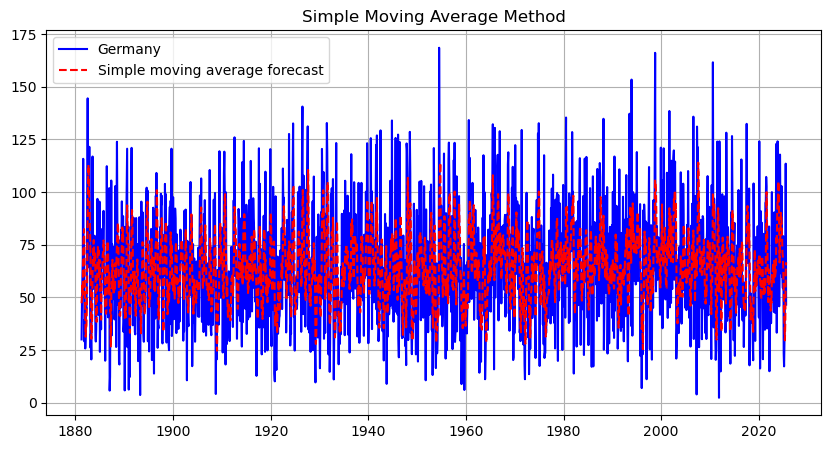

In [40]:
plt.figure(figsize=(10,5))

plt.plot(y_hat_rm['Germany'], label = 'Germany', color = 'blue')
plt.plot(y_hat_rm['RollingMean'], label = 'Simple moving average forecast', linestyle = '--', color = 'red')
plt.legend()
plt.title('Simple Moving Average Method')
plt.grid()
plt.show()

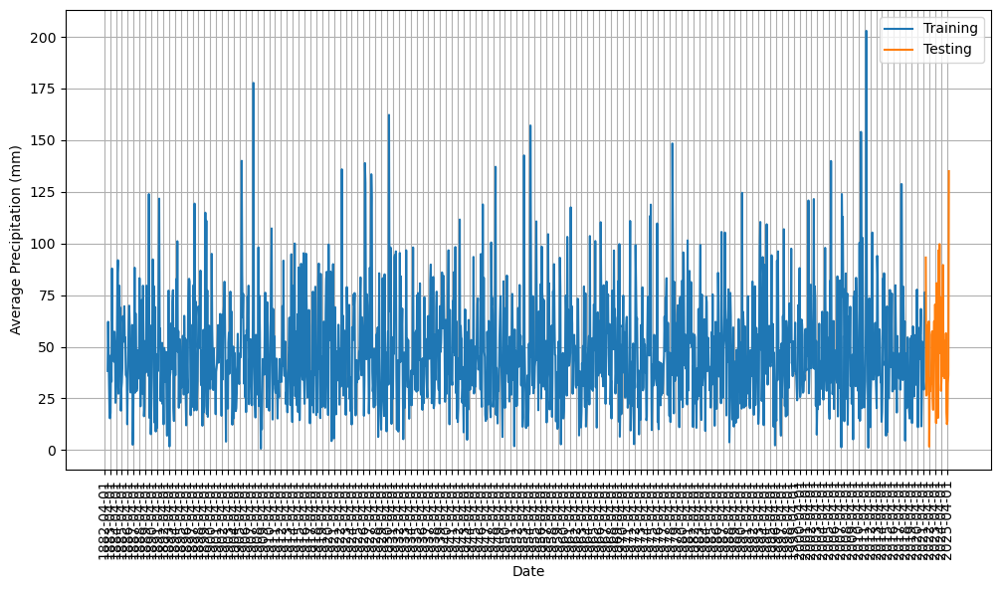

In [41]:
X, y = [], []
lag = 18
for i in range(len(y_hat_rm) - lag - 1):
  X.append(y_hat_rm.iloc[i:i + lag, 2])
  y.append(y_hat_rm.iloc[i + lag, 2])
X = np.squeeze(X)
y = np.squeeze(y)

split_idx = 48
x_train, y_train, x_test, y_test=X[:-split_idx], y[:-split_idx], X[-split_idx:], y[-split_idx:]

plt.figure(figsize = (12, 6))
plt.xlabel("Date")
plt.ylabel("Average Precipitation (mm)")

plt.plot(y_hat_rm.index[lag + 1:-split_idx],y_train, label = 'Training')
plt.plot(y_hat_rm.index[-split_idx:],y_test, label = 'Testing')
plt.xticks(y_hat_rm.index[lag - 6::12],  rotation = 'vertical')
plt.legend()
plt.grid()
plt.show()

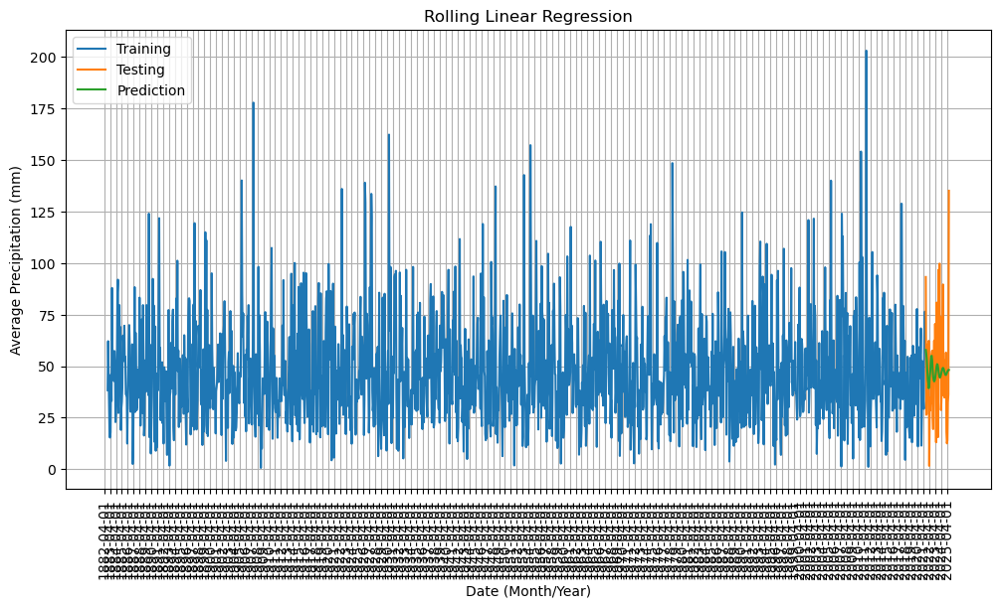

In [42]:
regr = LinearRegression()
regr.fit(x_train, y_train)

predictingset = [x for x in x_train[-1]]
y_pred = []
for i in range(len(x_test)):
    pred = regr.predict([predictingset])
    y_pred.append(pred[0])
    predictingset.append(pred[0])
    predictingset = predictingset[1:]



plt.figure(figsize=(12, 6))
plt.xlabel("Date (Month/Year)")
plt.ylabel("Average Precipitation (mm)")

plt.plot(y_hat_rm.index[lag + 1:-split_idx],y_train, label = 'Training')
plt.plot(y_hat_rm.index[-split_idx:], y_test, label = 'Testing')
plt.plot(y_hat_rm.index[-split_idx:], y_pred, label = 'Prediction')
plt.xticks(y_hat_rm.index[lag-6::12], rotation = 'vertical')
plt.legend()
plt.title('Rolling Linear Regression')
plt.grid()
plt.show()